---
title: Visualization for Area Unit Data
author: Serge Rey
date: '2023-02-23'
execute: 
  enabled: true
format:
  html:
    theme:
      light: flatly
      dark: darkly
    toc: true
jupyter: python3
---

## Statistical Visualization of Area Unit Data

## Geovisualization

### Choropleths

##  Areal Unit Data

In [1]:
import geopandas
import libpysal

In [2]:
south = libpysal.examples.load_example('South')

In [3]:
libpysal.examples.explain('South')

In [4]:
south_gdf = geopandas.read_file(south.get_path('south.shp'))

<Axes: >

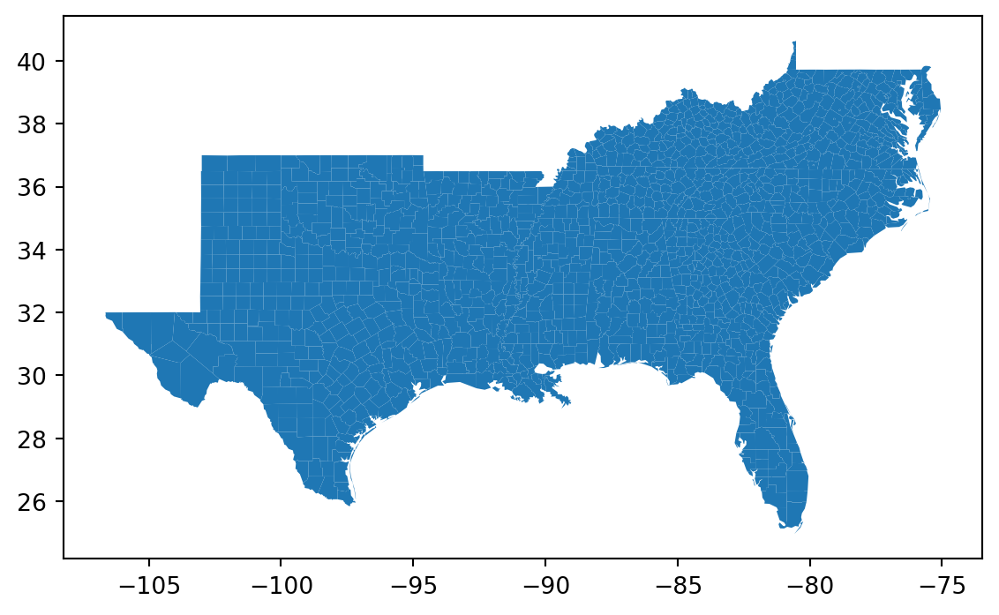

In [5]:
south_gdf.plot()

In [6]:
import seaborn

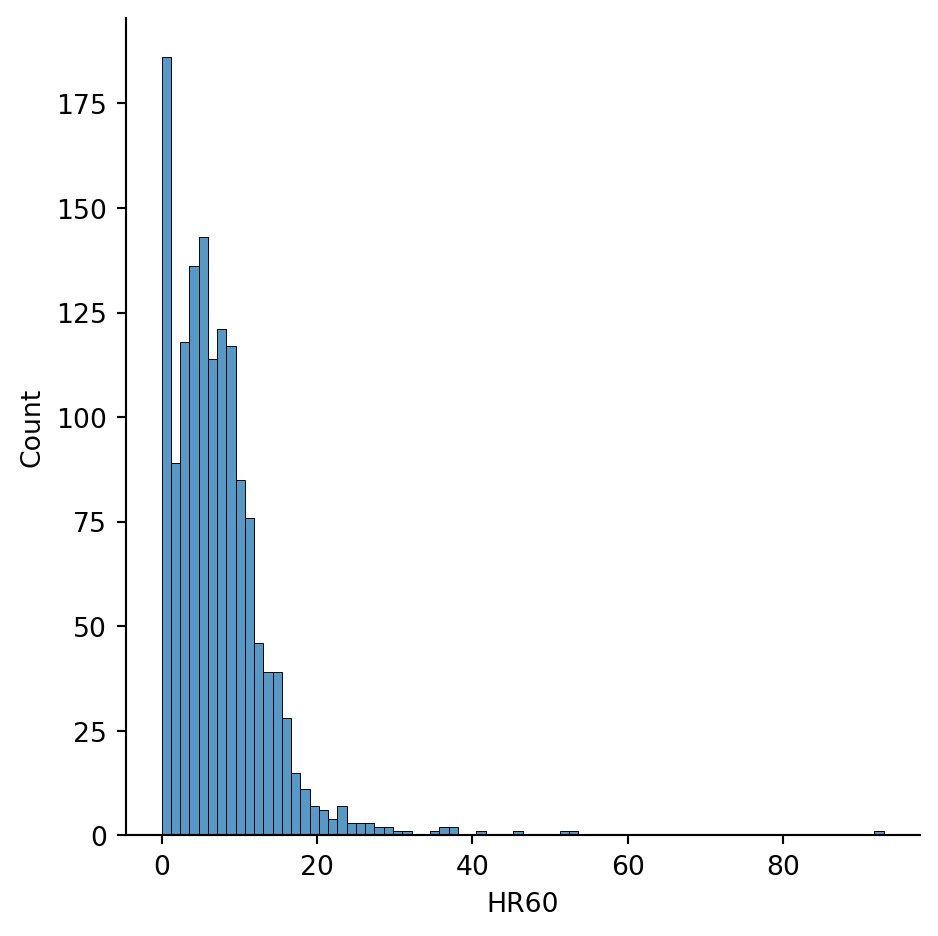

In [7]:
seaborn.displot(south_gdf, x='HR60')

In [8]:
south_gdf.explore(column='HR60')

In [9]:
south_gdf.HR60.describe()

count    1412.000000
mean        7.292144
std         6.421018
min         0.000000
25%         3.213471
50%         6.245125
75%         9.956272
max        92.936803
Name: HR60, dtype: float64

<Axes: >

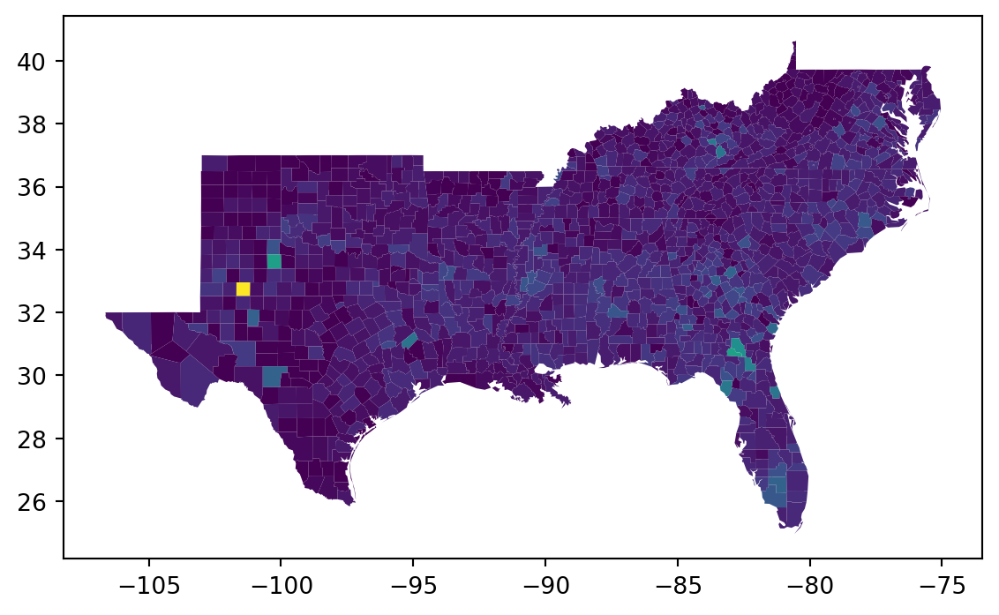

In [10]:
south_gdf.plot(column='HR60')

<Axes: >

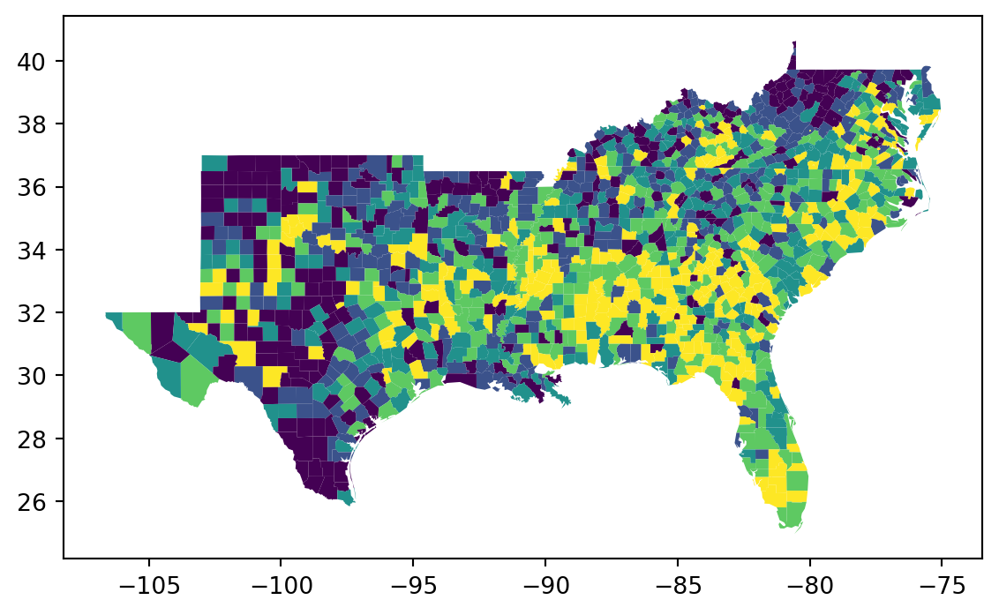

In [12]:
south_gdf.plot(column='HR60', scheme='Quantiles')

<Axes: >

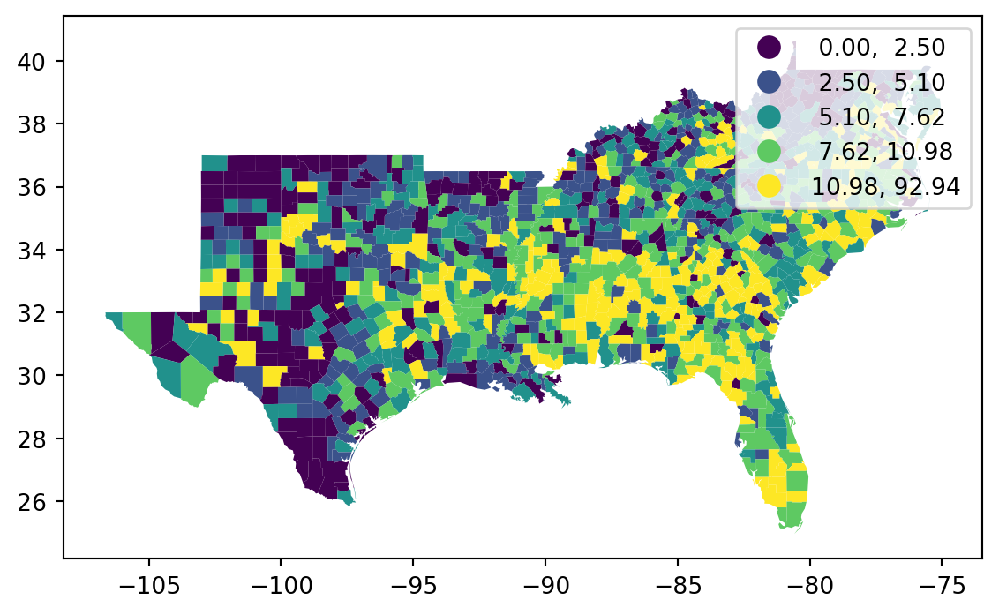

In [13]:
south_gdf.plot(column='HR60', scheme='Quantiles', legend=True)

## Classification Schemes

$$c_j \lt y_i \le c_{j+1} \forall y_i \in C_j$$

where $y_i$ is the value for the attribute at location $i$, $j$ is a class index, and $c_j$ represents the lower bound of interval $j$.

In [14]:
import mapclassify

In [15]:
mapclassify.Quantiles(south_gdf.HR60)

Quantiles

   Interval      Count
----------------------
[ 0.00,  2.50] |   283
( 2.50,  5.10] |   282
( 5.10,  7.62] |   282
( 7.62, 10.98] |   282
(10.98, 92.94] |   283

In [16]:
mapclassify.Quantiles(south_gdf.HR60, k=10)

Quantiles

   Interval      Count
----------------------
[ 0.00,  0.00] |   180
( 0.00,  2.50] |   103
( 2.50,  3.93] |   141
( 3.93,  5.10] |   141
( 5.10,  6.25] |   141
( 6.25,  7.62] |   141
( 7.62,  9.19] |   141
( 9.19, 10.98] |   141
(10.98, 14.31] |   141
(14.31, 92.94] |   142

In [17]:
mapclassify.EqualInterval(south_gdf.HR60, k=10)

EqualInterval

   Interval      Count
----------------------
[ 0.00,  9.29] |  1000
( 9.29, 18.59] |   358
(18.59, 27.88] |    39
(27.88, 37.17] |     8
(37.17, 46.47] |     4
(46.47, 55.76] |     2
(55.76, 65.06] |     0
(65.06, 74.35] |     0
(74.35, 83.64] |     0
(83.64, 92.94] |     1

In [18]:
mapclassify.MaximumBreaks(south_gdf.HR60, k=10)

MaximumBreaks

   Interval      Count
----------------------
[ 0.00, 29.42] |  1400
(29.42, 30.74] |     1
(30.74, 33.40] |     1
(33.40, 35.94] |     1
(35.94, 39.00] |     4
(39.00, 43.29] |     1
(43.29, 48.96] |     1
(48.96, 52.69] |     1
(52.69, 73.12] |     1
(73.12, 92.94] |     1

In [19]:
mapclassify.FisherJenks(south_gdf.HR60, k=10)

/Users/serge/miniconda3/envs/courses/lib/python3.10/site-packages/mapclassify/classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


FisherJenks

   Interval      Count
----------------------
[ 0.00,  1.71] |   216
( 1.71,  4.45] |   278
( 4.45,  7.08] |   287
( 7.08, 10.02] |   288
(10.02, 13.59] |   176
(13.59, 19.60] |   121
(19.60, 28.77] |    34
(28.77, 40.74] |     8
(40.74, 53.30] |     3
(53.30, 92.94] |     1

In [20]:
mapclassify.BoxPlot(south_gdf.HR60)

BoxPlot

   Interval      Count
----------------------
( -inf, -6.90] |     0
(-6.90,  3.21] |   353
( 3.21,  6.25] |   353
( 6.25,  9.96] |   353
( 9.96, 20.07] |   311
(20.07, 92.94] |    42

In [21]:
mapclassify.HeadTailBreaks(south_gdf.HR60)

HeadTailBreaks

   Interval      Count
----------------------
[ 0.00,  7.29] |   802
( 7.29, 12.41] |   405
(12.41, 18.18] |   147
(18.18, 26.87] |    40
(26.87, 38.73] |    13
(38.73, 56.98] |     4
(56.98, 92.94] |     1

## Map Customization

- Legends
- Color Schemes


### Legends

In [22]:
south_gdf[['STATE_NAME', 'HR60', 'HR90']].head()

,STATE_NAME,HR60,HR90
0,West Virginia,1.682864,0.946083
1,West Virginia,4.607233,1.234934
2,West Virginia,0.974132,2.621009
3,West Virginia,0.876248,4.461577
4,Delaware,4.228385,6.712736


In [23]:
south_gdf['increased' ] =  south_gdf.HR90 > south_gdf.HR60

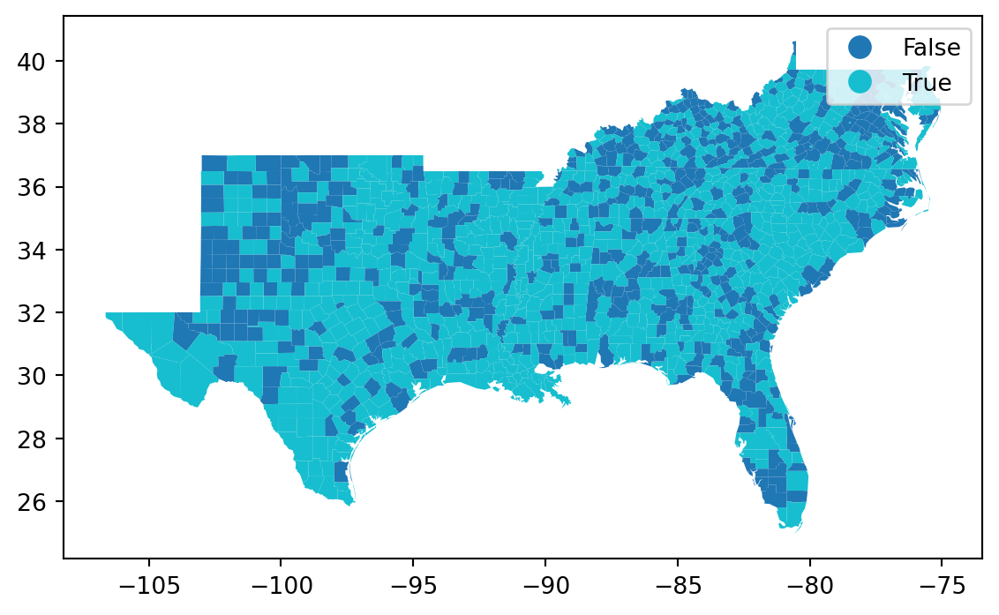

In [24]:
south_gdf.plot(column='increased', categorical=True, legend=True);

In [25]:
v = south_gdf.increased.map({True: 'Increased', False: 'Decreased'})

In [26]:
south_gdf['Increased'] = v

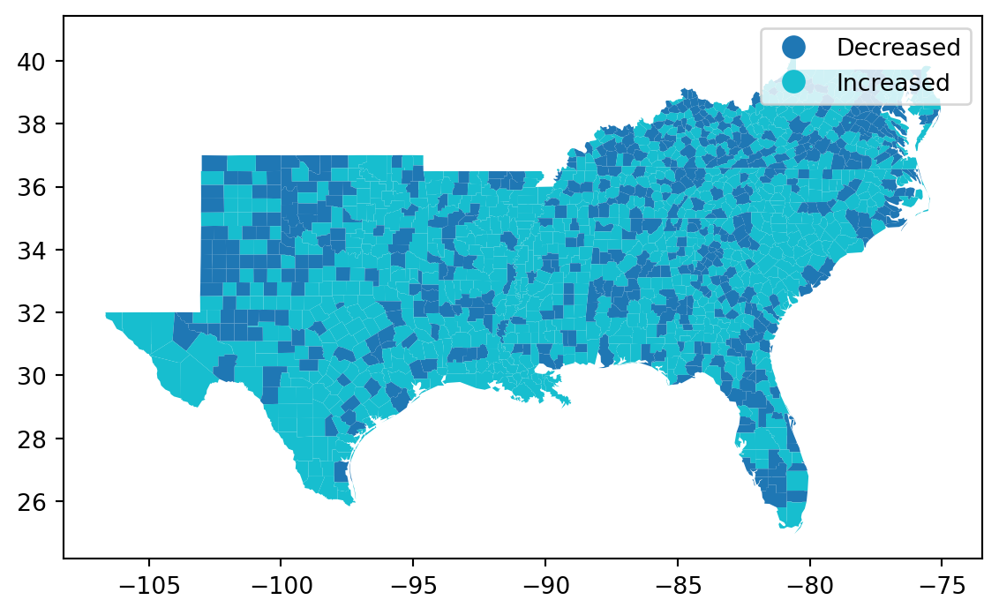

In [27]:
south_gdf.plot(column='Increased', categorical=True, legend=True);

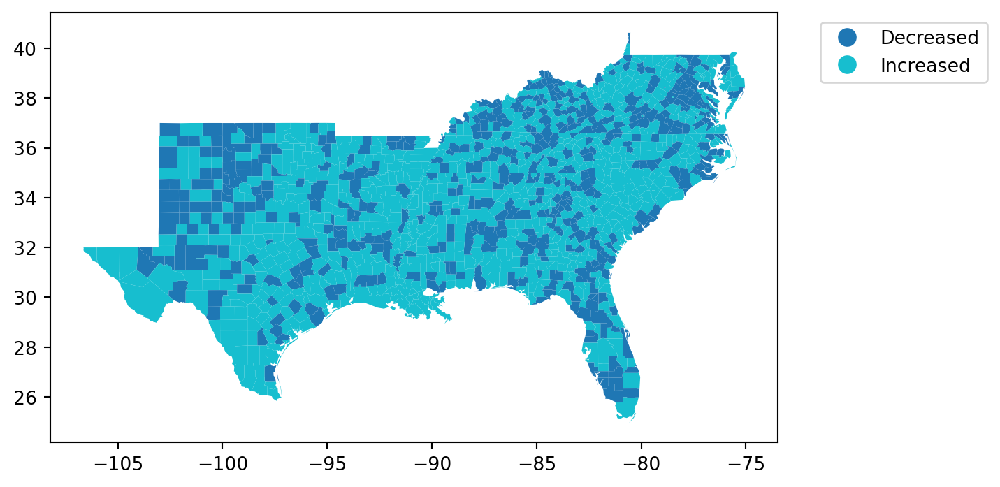

In [28]:
south_gdf.plot(column='Increased', categorical=True, legend=True,
               legend_kwds={'bbox_to_anchor': (1.3, 1)});

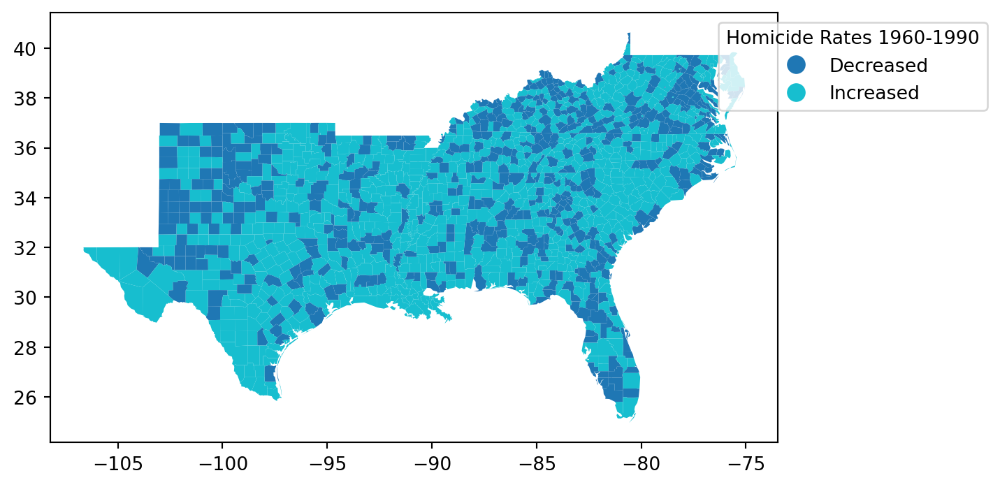

In [29]:
south_gdf.plot(column='Increased', categorical=True, legend=True,
               legend_kwds={'bbox_to_anchor': (1.3, 1),
                           'title':'Homicide Rates 1960-1990'},
           );

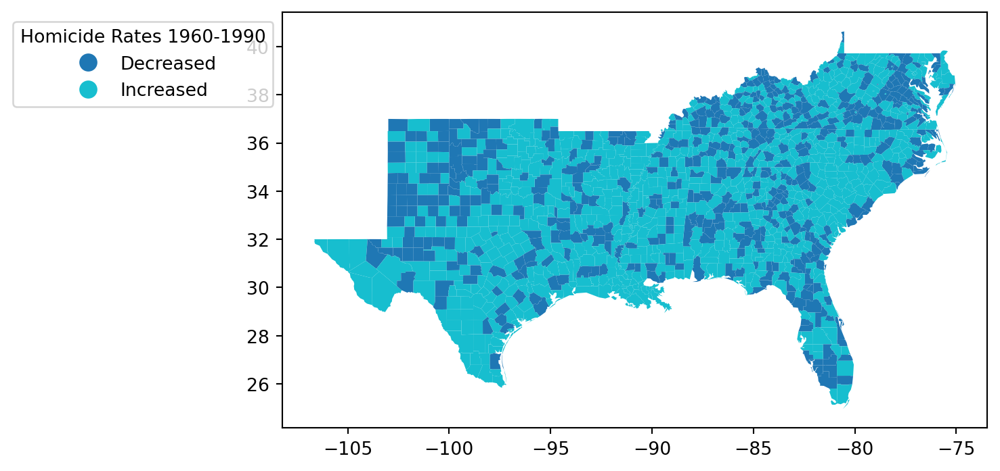

In [30]:
south_gdf.plot(column='Increased', categorical=True, legend=True,
               legend_kwds={'bbox_to_anchor': (0, 1),
                           'title':'Homicide Rates 1960-1990'},
           );

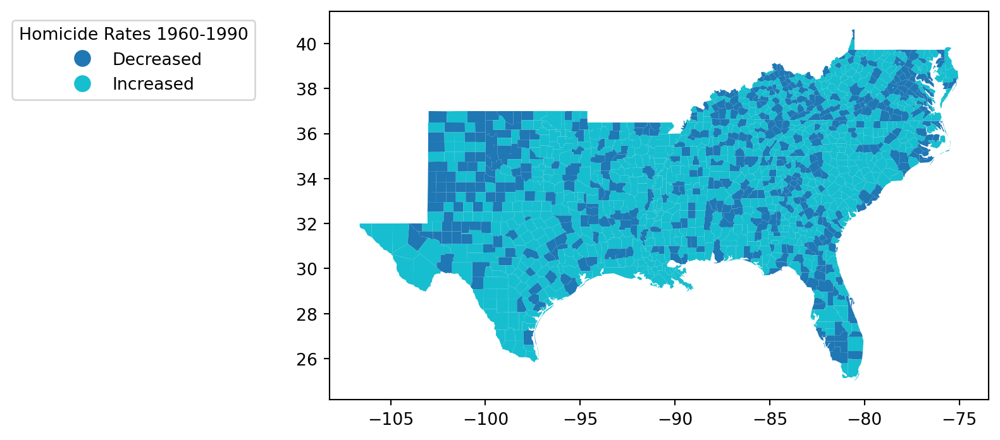

In [31]:
south_gdf.plot(column='Increased', categorical=True, legend=True,
               legend_kwds={'bbox_to_anchor': (-0.1, 1),
                           'title':'Homicide Rates 1960-1990'},
           );

### Color schemes

For more info see [matplotlib](https://matplotlib.org/stable/tutorials/colors/colormaps.html)

#### Sequential Color Schemes

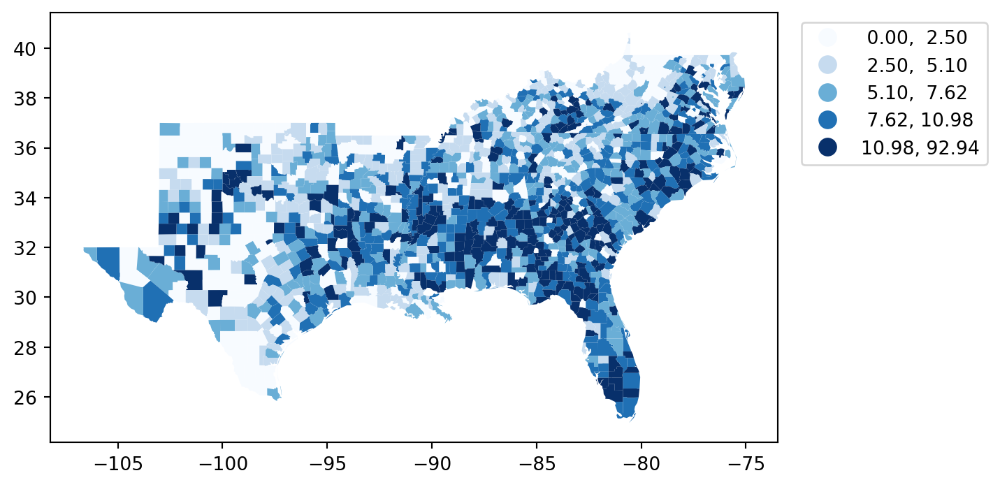

In [32]:
south_gdf.plot(column='HR60', scheme='Quantiles', legend=True, 
                legend_kwds={'bbox_to_anchor': (1.3, 1)},
               cmap='Blues');

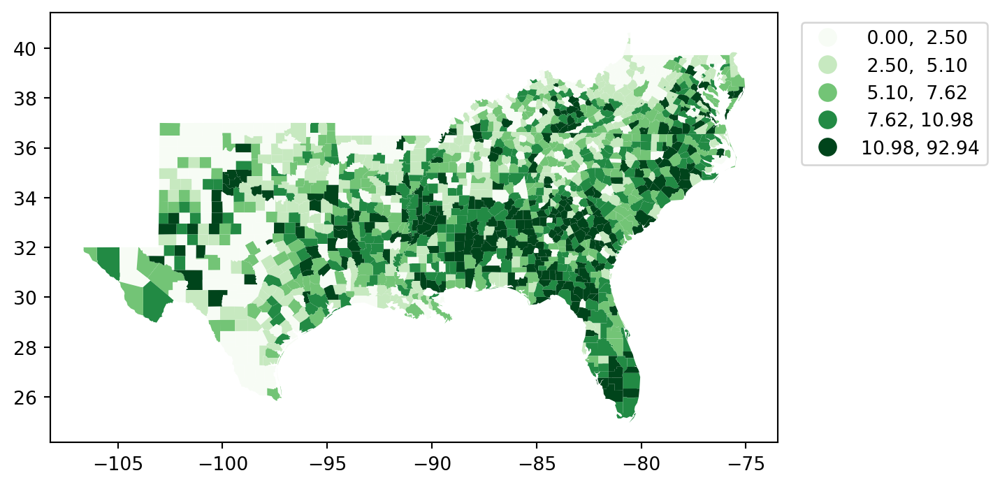

In [33]:
south_gdf.plot(column='HR60', scheme='Quantiles', legend=True, 
                legend_kwds={'bbox_to_anchor': (1.3, 1)},
               cmap='Greens');

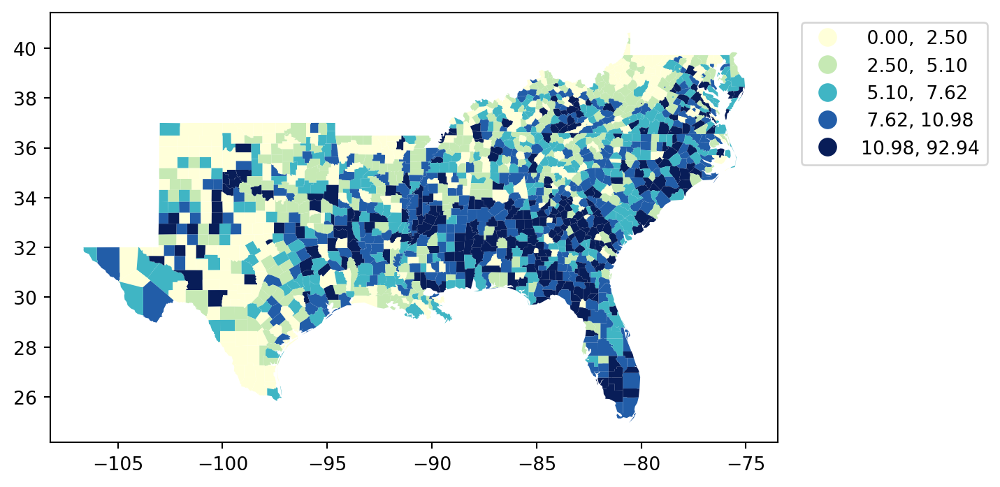

In [34]:
south_gdf.plot(column='HR60', scheme='Quantiles', legend=True, 
                legend_kwds={'bbox_to_anchor': (1.3, 1)},
               cmap='YlGnBu');

#### Diverging Color Schme

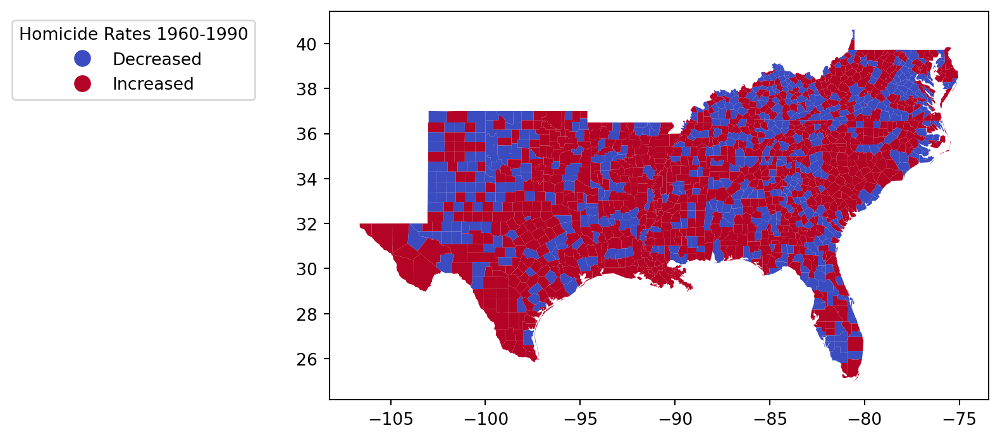

In [35]:
south_gdf.plot(column='Increased', categorical=True, legend=True,
               legend_kwds={'bbox_to_anchor': (-0.1, 1),
                           'title':'Homicide Rates 1960-1990'},
               cmap='coolwarm',
           );

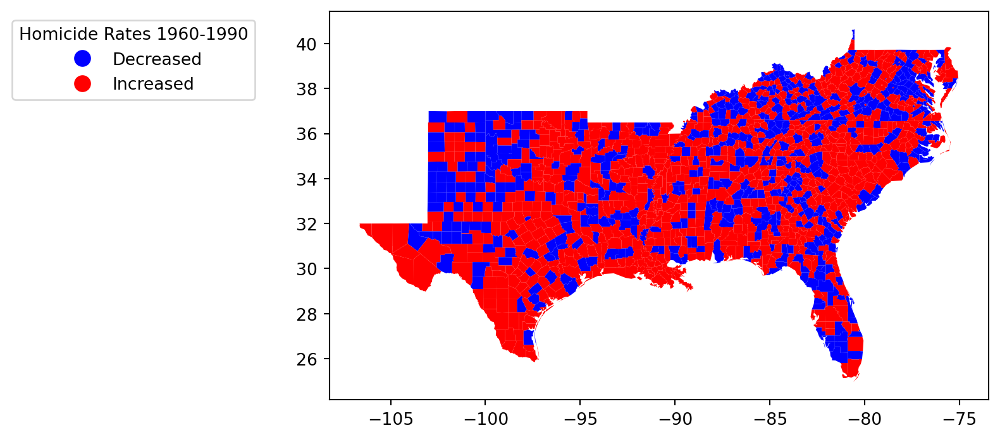

In [36]:
south_gdf.plot(column='Increased', categorical=True, legend=True,
               legend_kwds={'bbox_to_anchor': (-0.1, 1),
                           'title':'Homicide Rates 1960-1990'},
               cmap='bwr',
           );

#### Qualitative Color Scheme

<Axes: >

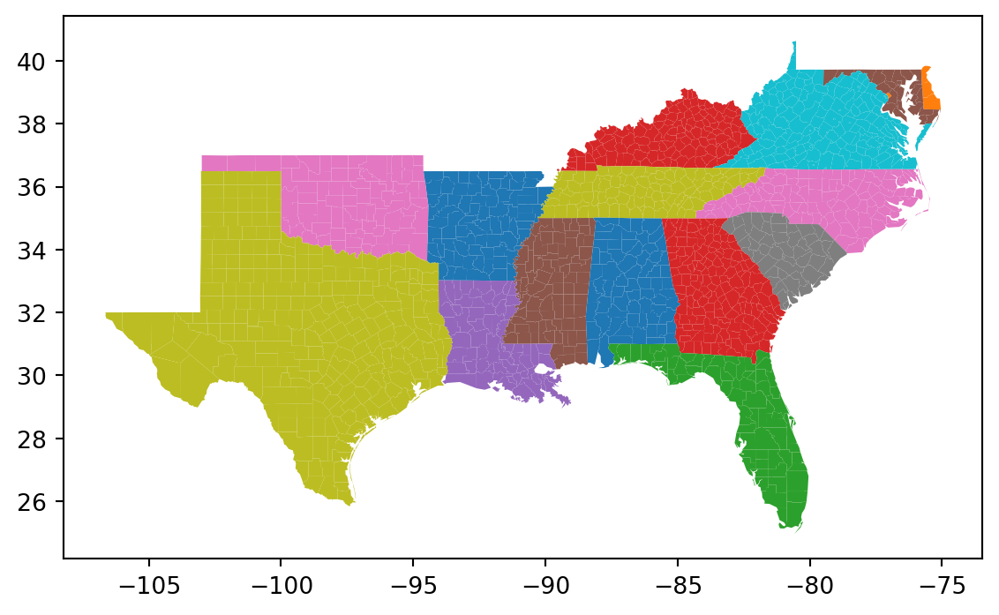

In [37]:
south_gdf.plot(column='STATE_NAME', categorical=True)

<Axes: >

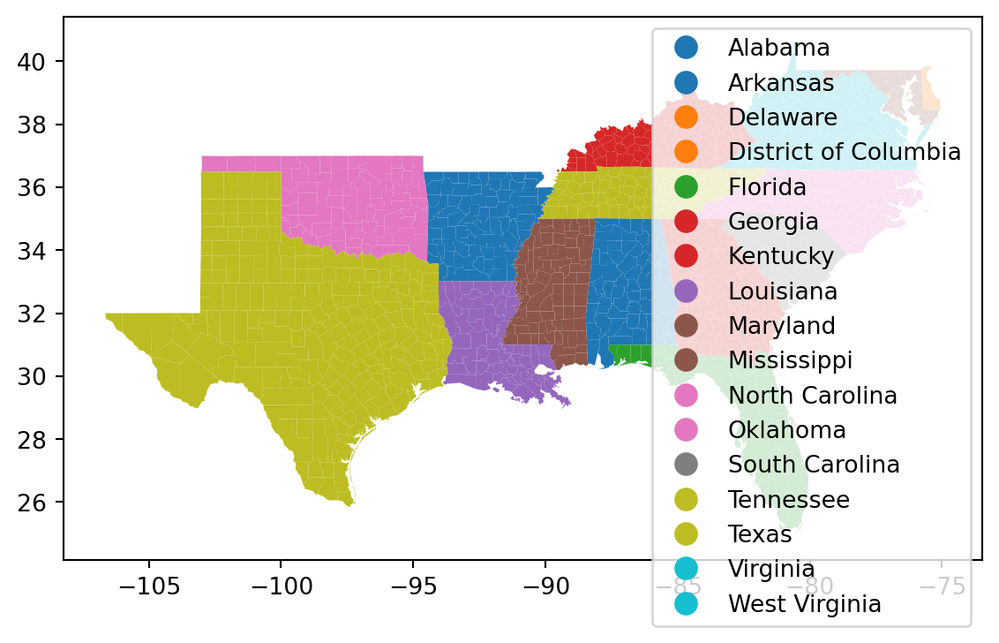

In [38]:
south_gdf.plot(column='STATE_NAME', categorical=True, legend=True)

<Axes: >

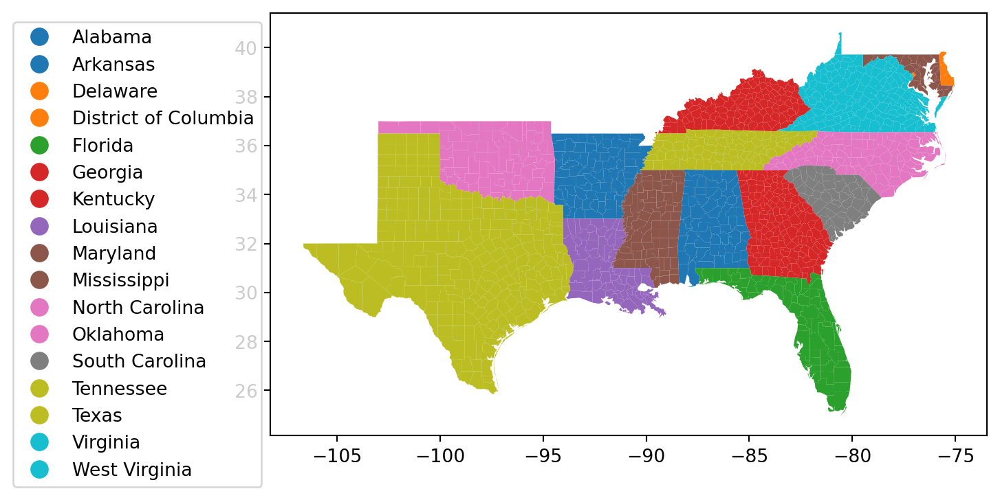

In [39]:
south_gdf.plot(column='STATE_NAME', categorical=True, legend=True,
               legend_kwds={'bbox_to_anchor': (0, 1)})

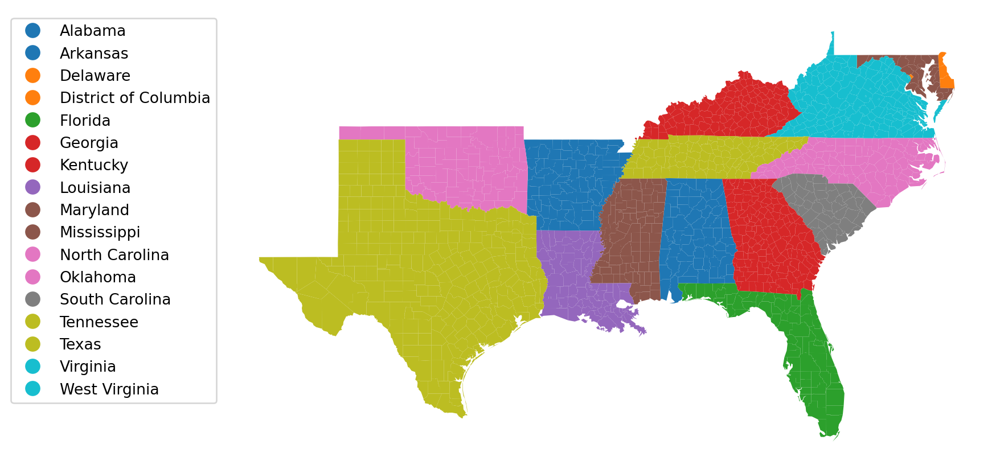

In [40]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
ax.axis('off')

south_gdf.plot(column='STATE_NAME', categorical=True, legend=True,
               legend_kwds={'bbox_to_anchor': (0, 1)}, ax=ax);

## Comparisons (Sequential)

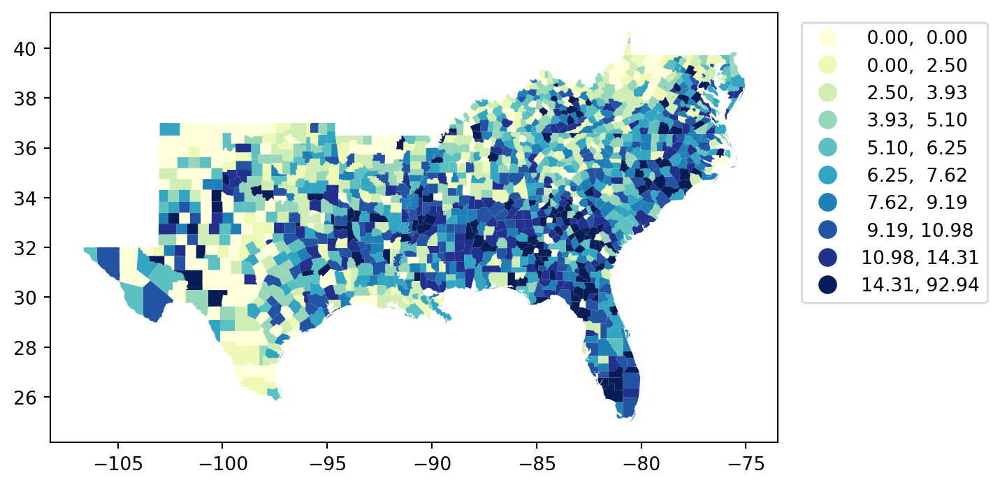

In [41]:
south_gdf.plot(column='HR60', scheme='Quantiles', legend=True, 
                legend_kwds={'bbox_to_anchor': (1.3, 1)},
               cmap='YlGnBu', k=10);

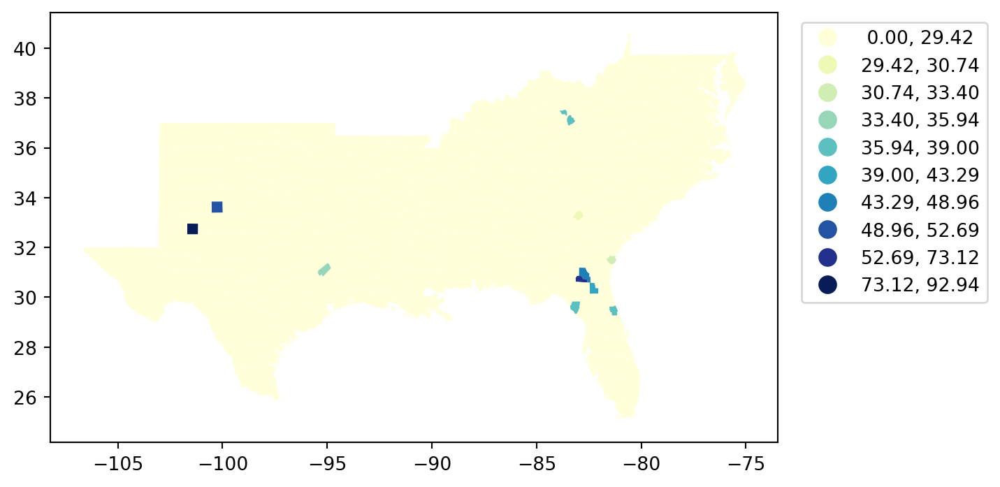

In [42]:
south_gdf.plot(column='HR60', scheme='MaximumBreaks', legend=True, 
                legend_kwds={'bbox_to_anchor': (1.3, 1)},
               cmap='YlGnBu', k=10);

/Users/serge/miniconda3/envs/courses/lib/python3.10/site-packages/mapclassify/classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


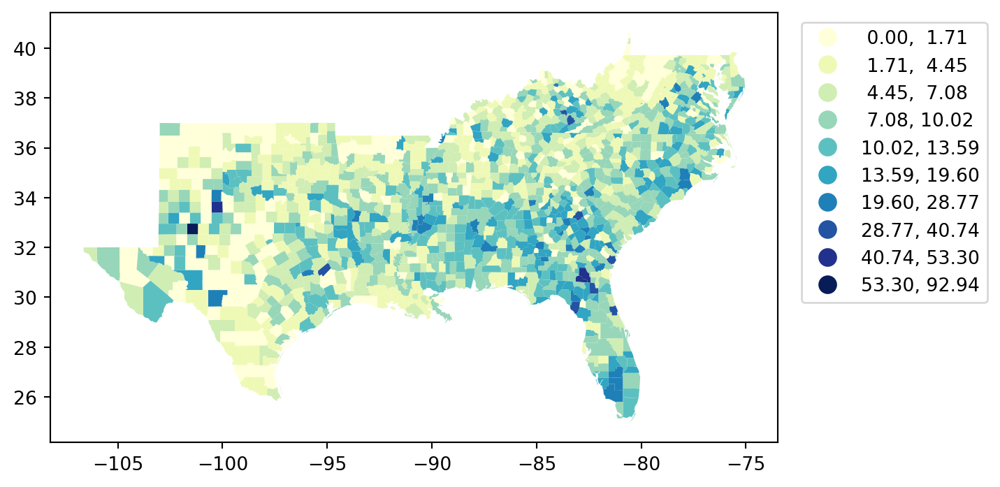

In [43]:
south_gdf.plot(column='HR60', scheme='FisherJenks', legend=True, 
                legend_kwds={'bbox_to_anchor': (1.3, 1)},
               cmap='YlGnBu', k=10);